In [3]:
# Some standard imports
import io
from fastai.data.core import DataLoaders
import numpy as np
from torch.utils.data import Dataset, DataLoader, default_collate
import torchvision
from torchvision.transforms import Compose
import json
import seaborn as sns
import seaborn.objects as so
sns.set_theme()
import pandas as pd
import matplotlib.pyplot as plt
from torch import nn
import torch.utils.model_zoo as model_zoo
import torch.onnx
from scipy import interpolate
from collections import defaultdict
%load_ext tensorboard
from torch.utils.tensorboard import SummaryWriter
from fastai.metrics import accuracy, rmse, mse, mae
from fastai.learner import Learner
from fastai.losses import MSELossFlat
from fastai.optimizer import Adam
from fastai.callback.core import Callback
from fastai.callback.progress import ShowGraphCallback
from fastai.callback.tensorboard import TensorBoardCallback

# ResNet

In [ ]:
def _padding(downsample, kernel_size):
    """Compute required padding"""
    padding = max(0, int(np.floor((kernel_size - downsample + 1) / 2)))
    return padding


def _downsample(n_samples_in, n_samples_out):
    """Compute downsample rate"""
    downsample = int(n_samples_in // n_samples_out)
    if downsample < 1:
        raise ValueError("Number of samples should always decrease")
    if n_samples_in % n_samples_out != 0:
        raise ValueError(
            "Number of samples for two consecutive blocks "
            "should always decrease by an integer factor."
        )
    return downsample


class ResBlock1d(nn.Module):
    """
    Residual network unit for unidimensional signals.
    """

    def __init__(
        self, n_filters_in, n_filters_out, downsample, kernel_size, dropout_rate
    ):
        if kernel_size % 2 == 0:
            raise ValueError("This implementation only supports odd `kernel_size`.")
        super(ResBlock1d, self).__init__()

        # Forward path
        padding = _padding(1, kernel_size)
        self.conv1 = nn.Conv1d(
            n_filters_in, n_filters_out, kernel_size, padding=padding, bias=False
        )
        self.bn1 = nn.BatchNorm1d(n_filters_out)
        self.relu = nn.LeakyReLU()
        self.dropout1 = nn.Dropout(dropout_rate)
        padding = _padding(downsample, kernel_size)
        self.conv2 = nn.Conv1d(
            n_filters_out,
            n_filters_out,
            kernel_size,
            stride=downsample,
            padding=padding,
            bias=False,
        )
        self.bn2 = nn.BatchNorm1d(n_filters_out)
        self.dropout2 = nn.Dropout(dropout_rate)

        # Skip connection
        skip_connection_layers = []

        # Deal with downsampling
        if downsample > 1:
            maxpool = nn.MaxPool1d(downsample, stride=downsample)
            skip_connection_layers += [maxpool]

        # Deal with n_filters dimension increase
        if n_filters_in != n_filters_out:
            conv1x1 = nn.Conv1d(n_filters_in, n_filters_out, 1, bias=False)
            skip_connection_layers += [conv1x1]

        # Build skip connection layer
        if skip_connection_layers:
            self.skip_connection = nn.Sequential(*skip_connection_layers)
        else:
            self.skip_connection = None

    def forward(self, x, y):
        """
        Residual unit.
        """

        if self.skip_connection is not None:
            y = self.skip_connection(y)
        else:
            y = y

        # 1st layer
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout1(x)

        # 2nd layer
        x = self.conv2(x)

        # Sum skip connection and main connection
        x += y

        y = x
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout2(x)
        return x, y


class ResNet1d(nn.Module):
    """
    Residual network for unidimensional signals.
    Parameters
    ----------
    input_dim : tuple
        Input dimensions. Tuple containing dimensions for the neural network
        input tensor. Should be like: ``(n_filters, n_samples)``.
    blocks_dim : list of tuples
        Dimensions of residual blocks.  The i-th tuple should contain the dimensions
        of the output (i-1)-th residual block and the input to the i-th residual
        block. Each tuple should be like: ``(n_filters, n_samples)``. `n_samples`
        for two consecutive samples should always decrease by an integer factor.
    dropout_rate: float [0, 1), optional
        Dropout rate used in all Dropout layers. Default is 0.8
    kernel_size: int, optional
        Kernel size for convolutional layers. The current implementation
        only supports odd kernel sizes. Default is 17.
    References
    ----------
    .. [1] K. He, X. Zhang, S. Ren, and J. Sun, "Identity Mappings in Deep Residual Networks,"
           arXiv:1603.05027, Mar. 2016. https://arxiv.org/pdf/1603.05027.pdf.
    .. [2] K. He, X. Zhang, S. Ren, and J. Sun, "Deep Residual Learning for Image Recognition," in 2016 IEEE Conference
           on Computer Vision and Pattern Recognition (CVPR), 2016, pp. 770-778. https://arxiv.org/pdf/1512.03385.pdf
    """

    def __init__(
        self, input_dim, blocks_dim, output_dim, kernel_size=17, dropout_rate=0.8
    ):
        super(ResNet1d, self).__init__()

        # First layers
        n_filters_in, n_filters_out = input_dim[0], blocks_dim[0][0]
        n_samples_in, n_samples_out = input_dim[1], blocks_dim[0][1]
        downsample = _downsample(n_samples_in, n_samples_out)
        padding = _padding(downsample, kernel_size)
        self.conv1 = nn.Conv1d(
            n_filters_in,
            n_filters_out,
            kernel_size,
            bias=False,
            stride=downsample,
            padding=padding,
        )
        self.bn1 = nn.BatchNorm1d(n_filters_out)

        # Residual block layers
        self.res_blocks = []
        for i, (n_filters, n_samples) in enumerate(blocks_dim):
            n_filters_in, n_filters_out = n_filters_out, n_filters
            n_samples_in, n_samples_out = n_samples_out, n_samples
            downsample = _downsample(n_samples_in, n_samples_out)
            resblk1d = ResBlock1d(
                n_filters_in, n_filters_out, downsample, kernel_size, dropout_rate
            )
            self.add_module("resblock1d_{0}".format(i), resblk1d)
            self.res_blocks += [resblk1d]

        # Linear layer
        n_filters_last, n_samples_last = blocks_dim[-1]
        last_layer_dim = n_filters_last  # * n_samples_last
        self.lin = nn.Linear(last_layer_dim, output_dim)
        self.n_blk = len(blocks_dim)

    def forward(self, x):
        """
        Implement ResNet1d forward propagation
        """

        # First layers
        x = self.conv1(x)
        x = self.bn1(x)

        # Residual blocks
        y = x
        for blk in self.res_blocks:
            x, y = blk(x, y)

        # Flatten array
        x = x.mean(-1)

        logits = self.lin(x)
        return logits


# Hydra

In [ ]:
from tsai.models.layers import rocket_nd_head, Flatten
from collections import OrderedDict
import torch.nn.functional as F

class HydraBackbonePlus(nn.Module):
    def __init__(self, c_in, c_out, seq_len, k = 8, g = 64, max_c_in = 8, clip=True, device="cuda", zero_init=True):

        super().__init__()

        self.k = k # num kernels per group
        self.g = g # num groups

        max_exponent = np.log2((seq_len - 1) / (9 - 1)) # kernel length = 9

        self.dilations = 2 ** torch.arange(int(max_exponent) + 1)
        self.num_dilations = len(self.dilations)

        self.paddings = torch.div((9 - 1) * self.dilations, 2, rounding_mode = "floor").int()

        # if g > 1, assign: half the groups to X, half the groups to diff(X)
        divisor = 2 if self.g > 1 else 1
        _g = g // divisor
        self._g = _g
        self.W = [self.normalize(torch.randn(divisor, k * _g, 1, 9).to("cuda")) for _ in range(self.num_dilations)]


        # combine c_in // 2 channels (2 < n < max_c_in)
        c_in_per = np.clip(c_in // 2, 2, max_c_in)
        self.I = [torch.randint(0, c_in, (divisor, _g, c_in_per)).to("cuda") for _ in range(self.num_dilations)]

        # clip values
        self.clip = clip

        self.device = torch.device("cuda")
        self.num_features = min(2, self.g) * self._g * self.k * self.num_dilations * 2

    @staticmethod
    def normalize(W):
        W -= W.mean(-1, keepdims = True)
        W /= W.abs().sum(-1, keepdims = True)
        return W

    # transform in batches of *batch_size*
    def batch(self, X, split=None, batch_size=256):
        bs = X.shape[0]
        if bs <= batch_size:
            return self(X)
        elif split is None:
            Z = []
            for i in range(0, bs, batch_size):
                Z.append(self(X[i:i+batch_size]))
            return torch.cat(Z)
        else:
            Z = []
            batches = torch.as_tensor(split).split(batch_size)
            for i, batch in enumerate(batches):
                Z.append(self(X[batch]))
            return torch.cat(Z)

    def forward(self, X):

        bs = X.shape[0]

        if self.g > 1:
            diff_X = torch.diff(X)

        Z = []

        for dilation_index in range(self.num_dilations):

            d = self.dilations[dilation_index].item()
            p = self.paddings[dilation_index].item()

            # diff_index == 0 -> X
            # diff_index == 1 -> diff(X)
            for diff_index in range(min(2, self.g)):

                _Z = F.conv1d(X[:, self.I[dilation_index][diff_index]].sum(2) if diff_index == 0 else diff_X[:, self.I[dilation_index][diff_index]].sum(2),
                              self.W[dilation_index][diff_index], dilation = d, padding = p, groups = self._g).view(bs, self._g, self.k, -1)

                max_values, max_indices = _Z.max(2)
                count_max = torch.zeros(bs, self._g, self.k, device=self.device)

                min_values, min_indices = _Z.min(2)
                count_min = torch.zeros(bs, self._g, self.k, device=self.device)

                count_max.scatter_add_(-1, max_indices, max_values)
                count_min.scatter_add_(-1, min_indices, torch.ones_like(min_values))

                Z.append(count_max)
                Z.append(count_min)

        Z = torch.cat(Z, 1).view(bs, -1)

        if self.clip:
            Z = F.relu(Z)

        return Z

# %% ../../nbs/079_models.HydraPlus.ipynb 5
class HydraPlus(nn.Sequential):

    def __init__(self,
        c_in:int, # num of channels in input
        c_out:int, # num of channels in output
        seq_len:int, # sequence length
        d:tuple=None, # shape of the output (when ndim > 1)
        k:int=8, # number of kernels per group
        g:int=64, # number of groups
        max_c_in:int=8, # max number of channels per group
        clip:bool=True, # clip values >= 0
        use_bn:bool=True, # use batch norm
        fc_dropout:float=0., # dropout probability
        custom_head=None, # optional custom head as a torch.nn.Module or Callable
        zero_init:bool=True, # set head weights and biases to zero
        use_diff:bool=True, # use diff(X) as input
        device:str="cuda", # device to use
        ):

        # Backbone
        backbone = HydraBackbonePlus(c_in, c_out, seq_len, k=k, g=g, max_c_in=max_c_in, clip=clip, device=device, zero_init=zero_init)
        num_features = backbone.num_features


        # Head
        self.head_nf = num_features
        if custom_head is not None:
            if isinstance(custom_head, nn.Module): head = custom_head
            else: head = custom_head(self.head_nf, c_out, 1)
        elif d is not None:
            head = rocket_nd_head(num_features, c_out, seq_len=None, d=d, use_bn=use_bn, fc_dropout=fc_dropout, zero_init=zero_init)
        else:
            layers = [Flatten()]
            if use_bn:
                layers += [nn.BatchNorm1d(num_features,device=torch.device("cuda"))]
            if fc_dropout:
                layers += [nn.Dropout(fc_dropout,device=torch.device("cuda"))]
            linear = nn.Linear(num_features, c_out, device=torch.device("cuda"))
            if zero_init:
                nn.init.constant_(linear.weight.data, 0)
                nn.init.constant_(linear.bias.data, 0)
            layers += [linear]
            head = nn.Sequential(*layers)

        super().__init__(OrderedDict([('backbone', backbone), ('head', head)]))

# Load model

In [79]:
from tsai.models.XResNet1dPlus import xresnet1d34_deeperplus, xresnet1d18plus

def load_model(arch,seq_len):
    match arch:
        case "ResNet1d":
            model = ResNet1d(
                input_dim=(1,seq_len),
                blocks_dim=list(
                    zip([32, 64, 128, 256, 512], [500, 250, 50, 10,5])
                ),
                output_dim=2,
                kernel_size=17,
                dropout_rate=0.1,
            )
        case "XResNet1d34":
            model = xresnet1d34_deeperplus(1,2,seq_len=seq_len)
        case "XResNet1d18":
            model = xresnet1d18plus(1,2,seq_len=seq_len)
        case "Hydra":
            model = HydraPlus(1,2,seq_len)
        case _:
            raise ValueError("Unsupported archticture")

    #model = model.to("cuda")
    return model

# Dataset preparation

In [20]:
max_time=0.5
frequency=3000
class CSPDataSet(Dataset):
    def __init__(self, json_file, split=None, labels=True, transform=None, format="dict", copies=1):
        with open(json_file) as f:
          data=json.load(f)
          if split is None:
            indices = range(len(data))
          else: 
            indices = [i for i,d in enumerate(data) if d["split"]==split]
          max_index = int(frequency*max_time)
          self.signals = np.array([d["signal"] for d in data])[indices,:max_index]*1000
          self.csps = np.array([d["csp_label"] for d in data])[indices]/max_time
          self.labels = np.array([f'#{d["id"]}' for d in data])[indices]
          self.time_range = np.array([0,max_time])
        self.transform = transform
        self.return_labels = labels
        self.copies = copies
        self.format = format

    def __len__(self):
        return len(self.signals)*self.copies

    def __getitem__(self, idx):
        if isinstance(idx,slice):
            return [self.__getitem__(i) for i in range(*idx.indices(self.__len__()))]
        data = {"copy": idx//len(self.signals)}
        idx = idx%len(self.signals)
        data["signal"] = self.signals[idx]
        data["label"] = self.labels[idx]
        data["time"] = np.linspace(0,1,data["signal"].shape[0])
        if self.return_labels:
            data["csp"] = self.csps[idx]
        if self.transform:
            data = self.transform(data)
        if self.format == "dict":
            return data
        else:
            return (data["signal"],data["csp"])

In [91]:
def randomTimeWarp(pts=2,mag=.5,invrtPts=None,y0=0,y1=1):
  xs=np.arange(pts+2, dtype='float') / (pts+1)
  mag *= (y1-y0)
  ys=y0+(y1-y0)*xs
  ys[1:-1] += np.random.uniform(low=-mag/2/(pts+1),high=mag/2/(pts+1),size=(pts,))
  f=interpolate.interp1d(xs,ys,kind="cubic")
  if invrtPts is None:
    return f, None
  else:
    pts = []
    for y in invrtPts:
      i = np.searchsorted(ys,y)
      pts.append((y - ys[i-1]) * (xs[i] - xs[i-1]) / (ys[i] - ys[i-1]) + xs[i-1])
    return f, pts

In [7]:
class WarpTransform:
    """Randomly and smoothly warp time and magnitude"""
    def __init__(self, pts=3, mag=.5, random_crop_probab = 0, downsample_to=None):
        #self.start_time_range = start_time_range
        #self.end_time_range = end_time_range
        self.pts = pts
        self.mag = mag
        self.downsample_to = downsample_to
        self.random_crop_probab = random_crop_probab

    def __call__(self, data):
        f = interpolate.interp1d(data["time"],data["signal"],kind="linear")
        start,end=0,1
        if "csp" in data and np.random.uniform() < self.random_crop_probab:
            start = np.random.uniform(low=0,high=.8*data["csp"][0])
            end = np.random.uniform(low=.8*data["csp"][1]+.2,high=1)
        tw,csp_new = randomTimeWarp(pts=self.pts,
                                    mag=self.mag,
                                    y0=start, y1=end,
                                    invrtPts=data["csp"] if "csp" in data else None)
        if self.downsample_to:
            data["time"] = np.linspace(data["time"][0],data["time"][-1],self.downsample_to)
        warped_time = tw(data["time"])
        warped_signal = f(warped_time)
        warped_data = {**data, "signal": warped_signal*(warped_time-data["time"]+1)}
        if csp_new:
          warped_data["csp"] = csp_new
        warped_data["tw"] = tw
        return warped_data

class AsTensor:
    def __call__(self,data):
        tensor_data = {**data, "signal": torch.unsqueeze(torch.tensor(data["signal"]).float(),dim=0)}
        if "csp" in tensor_data:
            tensor_data["csp"] = torch.tensor(tensor_data["csp"]).float()
        return tensor_data

class Downsample:
    def __init__(self,to):
        self.to = to

    def __call__(self,data):
        f = interpolate.interp1d(data["time"],data["signal"],kind="linear")
        data_trans = {**data, "time": np.linspace(data["time"][0],data["time"][-1],self.to)}
        data_trans["signal"] = f(data_trans["time"])
        return data_trans

In [28]:
csp_dataset_train_raw = CSPDataSet("data.json",split="train", transform=Compose([WarpTransform(mag=.5,downsample_to=256, random_crop_probab=.8 ), AsTensor()]))

In [29]:
def dataset_to_df(dataset):
  df=pd.DataFrame(dataset)
  df["signal"] = [d[0].detach().numpy() for d in df["signal"]]
  df["csp"] = [d.detach().numpy() for d in df["csp"]]
  return df

def plot(df,markers={}):
  df=df.explode(["signal","time"]).reset_index()
  for name in markers.keys():
    df=pd.concat([df,pd.DataFrame(df[name].tolist(),columns=[name+"_on",name+"_off"])],axis=1)
  g = (
      so.Plot(data=df, x="time", y="signal")
      .facet("copy", "label")
      .add(so.Line())
      .limit(y=(-1, 1))
  )
  for name,color in markers.items():
    g = g.add(so.Range(color=color), x=name+"_on", ymin=-1, ymax=1).add(so.Range(color=color), x=name+"_off", ymin=-1, ymax=1)
  return g

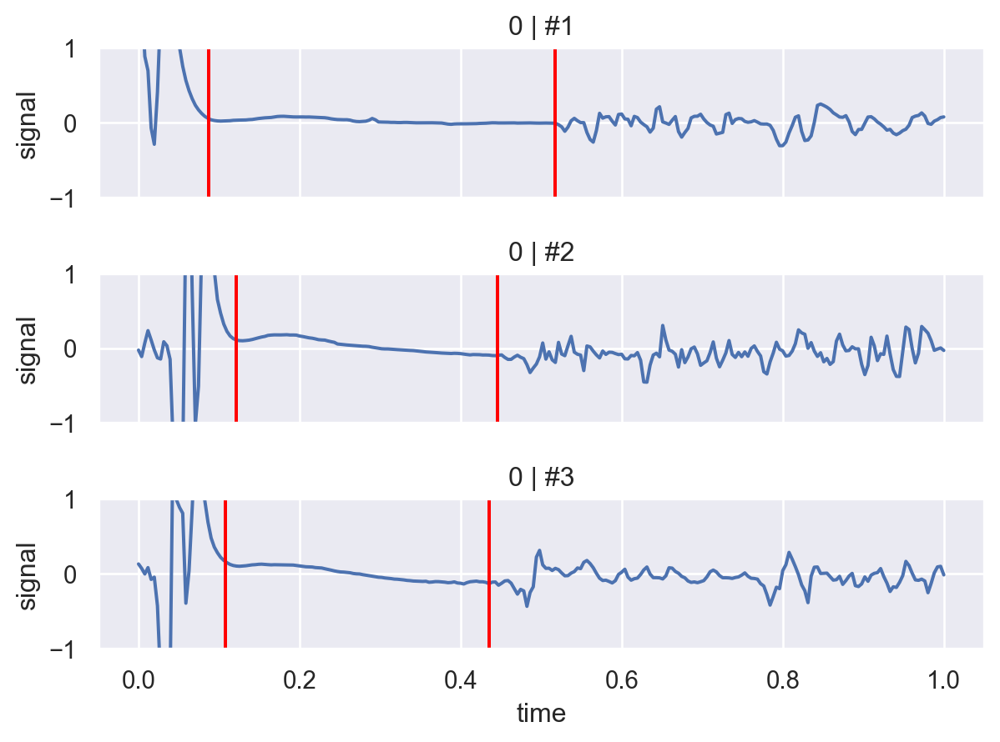

In [30]:
plot(dataset_to_df(csp_dataset_train_raw[0:3]),{"csp":"red"})

In [31]:
def collate_fn(data):
    outData = {key: default_collate([d[key] for d in data]) for key in data[0].keys() if key != "tw"}
    if "tw" in data[0]:
        outData["tw"] = [d["tw"] for d in data]
    return outData

# Training

In [32]:
writer = SummaryWriter('logs')

In [33]:
%tensorboard --logdir=/content/logs

Launching TensorBoard...

In [80]:
def EvalModel(model, loader):
  df=pd.DataFrame()
  for batch in loader:
    y_pred = model(batch["signal"].to("mps")).detach().cpu().numpy()
    dic = {"csp_pred": list(y_pred), "label": batch["label"], "copy": batch["copy"].detach().numpy(), "signal": list(batch["signal"].detach().numpy()[:,0]),
                   "time": batch["time"].detach().numpy().tolist()}
    if "csp" in batch:
      dic["csp"] = list(batch["csp"].detach().numpy())
    if "tw" in batch:
      dic["tw"] = batch["tw"]
    new_df = pd.DataFrame(dic)
    df=pd.concat([df,new_df])
    df=df.reset_index()
    df.pop("index")
  return df
def rms(x): return (x**2).mean()**.5
def df_pred(df):
  for key in ["csp","csp_pred"]:
    df["real_"+key] = [r["tw"](np.minimum(1,np.maximum(0,r[key])))*max_time for _,r in df.iterrows()]
  df["type"]=[["on","off"]]*len(df)
  df=df.explode(["real_csp","real_csp_pred","type"])
  df=df.groupby(["label","type"]).agg({"real_csp": "mean", "real_csp_pred": ["mean","std","min","max","median"]})
  df=df.reset_index()
  df["training"] = [int(s[1:])-1 in tr for s in df["label"]]
  return df

In [81]:
class TensorBoardPlots(Callback):
  def __init__(self,writer,eval_loader):
    self.writer = writer
    self.eval_loader = eval_loader

  def after_epoch(self):
    values = torch.tensor(self.learn.recorder.values).detach().numpy()
    if len(values)>0:
      for v,name in zip(values[-1],["tr_loss","te_loss","te_rmse","te_mae"]):
        writer.add_scalar(name,v,len(values))
    if len(values)>1:
      history = pd.DataFrame(values, columns=["tr_loss","te_loss","te_rmse","te_mae"])
      history["tr_rmse"] = np.power(history["tr_loss"],.5)
      history["epoch"] = range(len(values))
      history = pd.melt(history,id_vars="epoch",value_vars=["te_mae", "tr_rmse","te_rmse"])
      g = (
          so.Plot(data=history, x="epoch",y="value",color="variable").add(so.Lines())
          .scale(y="log")
      )
      self.writer.add_figure("loss",g.plot()._figure,len(values))

    em=EvalModel(self.model,self.eval_loader)
    df = df_pred(em)
    g=(
      so.Plot(data=df)
      .add(so.Dots(), x=("real_csp","mean"), y=("real_csp_pred","median"), marker="type", color="training")
      .add(so.Range(), x=("real_csp","mean"), ymin=("real_csp_pred","min"), ymax=("real_csp_pred","max"), color="training")
    )
    #self.writer.add_figure("scatter",g.plot()._figure,len(values))
    df["error"] = np.abs(df[("real_csp_pred","median")] - df[("real_csp","mean")])
    df = df.sort_values(by="error")
    wi = [int(s[1:])-1 for s in df["label"][:2]]
    self.writer.add_figure("worst",plot(em.loc[[wi[0],wi[1],wi[0]+200,wi[1]+200],:],{"csp":"red","csp_pred":"green"}).plot()._figure,len(values))

In [84]:
arch = "XResNet1d34"
model = load_model(arch,256)
csp_dataset_train_warp = CSPDataSet("data.json",split="train",
                                    transform=Compose([WarpTransform(mag=.5,downsample_to=256, random_crop_probab=1 ), AsTensor()]), format="tuple", copies=150)
csp_dataset_test_warp = CSPDataSet("data.json",split="test",
                                    transform=Compose([WarpTransform(mag=.5,downsample_to=256, random_crop_probab=1 ), AsTensor()]),format="tuple", copies=30)
train_loader = DataLoader(csp_dataset_train_warp, batch_size=32,
                        shuffle=True, num_workers=2)
test_loader = DataLoader(csp_dataset_test_warp, batch_size=32,
                        shuffle=False, num_workers=2)
csp_dataset_eval = CSPDataSet("data.json",
                                    transform=Compose([WarpTransform(mag=.5,downsample_to=256, random_crop_probab=1), AsTensor()]),format="dict",copies=10)
eval_loader = DataLoader(csp_dataset_eval, batch_size=50,
                        shuffle=False, num_workers=0, collate_fn = collate_fn)
dls = DataLoaders(train_loader, test_loader)
learn = Learner(dls, model, loss_func=MSELossFlat(), opt_func=Adam, metrics=[rmse,mae],cbs=[TensorBoardPlots(writer,eval_loader)])

In [85]:
learn.fit_one_cycle(n_epoch=150)

epoch,train_loss,valid_loss,_rmse,mae,time
0,0.003055,0.003108,0.055745,0.039942,01:14
1,0.001739,0.001504,0.038778,0.027507,01:20
2,0.001008,0.001164,0.034120,0.023770,01:17
3,0.000910,0.001317,0.036294,0.024661,01:13
4,0.000700,0.000994,0.031522,0.019816,01:16
5,0.000650,0.001013,0.031821,0.020702,01:12
6,0.000471,0.000814,0.028530,0.018098,01:12
7,0.000516,0.000767,0.027697,0.018394,01:19
8,0.000357,0.001206,0.034732,0.023180,01:16
9,0.000294,0.000616,0.024820,0.015893,01:13


In [87]:
EvalModel(model,eval_loader)

,csp_pred,label,copy,signal,time,csp,tw
0,"[0.1800345, 0.6986804]",#1,0,"[0.024155306, -0.041958094, 0.050242323, 0.08002195, 0.074502185, 0.019072114, -0.0025070617, 0.03588883, 0.026388073, 0.09330127, 0.05819355, 0.001684252, -0.3815874, -1.6331704, -3.4024065, -5.551507, -5.1054964, -2.4829803, -0.22273645, 0.9941205, 1.8091426, 1.63358, 1.0028267, 0.71894866, 0.41920948, -0.23242746, -0.19496319, 0.3721432, 1.2358291, 2.2055614, 2.332224, 2.0966563, 1.849232, 1.5744108, 1.2061267, 0.9612675, 0.75721157, 0.59028554, 0.4600225, 0.36436793, 0.28263083, 0.21510074, 0.16563784, 0.12635228, 0.0913567, 0.06705965, 0.047422383, 0.03455497, 0.027277041, 0.02261034,...","[0.0, 0.00392156862745098, 0.00784313725490196, 0.011764705882352941, 0.01568627450980392, 0.0196078431372549, 0.023529411764705882, 0.027450980392156862, 0.03137254901960784, 0.03529411764705882, 0.0392156862745098, 0.043137254901960784, 0.047058823529411764, 0.050980392156862744, 0.054901960784313725, 0.058823529411764705, 0.06274509803921569, 0.06666666666666667, 0.07058823529411765, 0.07450980392156863, 0.0784313725490196, 0.08235294117647059, 0.08627450980392157, 0.09019607843137255, 0.09411764705882353, 0.09803921568627451, 0.10196078431372549, 0.10588235294117647, 0.1098039215686274...","[0.18053374, 0.70333046]",<scipy.interpolate._interpolate.interp1d object at 0x31e0c5900>
1,"[0.17225784, 0.74919164]",#2,0,"[-0.15705101, -0.111549914, 0.079639986, 0.067145206, 0.030610355, -0.072497234, -0.18464014, -0.66529214, -1.7888851, -3.4194582, -5.284932, -4.6534615, -3.5011263, -1.5671501, 0.004044159, 2.0469437, 3.1237173, 2.6475213, 1.2768993, 0.10273128, -0.9900943, -0.8487219, -0.6059642, 0.22191824, 1.3594416, 1.9341778, 1.8182979, 2.0771673, 2.353344, 1.9172393, 1.4647006, 1.0781251, 0.79674494, 0.63172483, 0.52922857, 0.43610272, 0.35479912, 0.28831846, 0.23472472, 0.19527406, 0.16297993, 0.14087431, 0.123162754, 0.10945197, 0.10163433, 0.09759972, 0.09413241, 0.093584225, 0.092821814, 0.09441...","[0.0, 0.00392156862745098, 0.00784313725490196, 0.011764705882352941, 0.01568627450980392, 0.0196078431372549, 0.023529411764705882, 0.027450980392156862, 0.03137254901960784, 0.03529411764705882, 0.0392156862745098, 0.043137254901960784, 0.047058823529411764, 0.050980392156862744, 0.054901960784313725, 0.058823529411764705, 0.06274509803921569, 0.06666666666666667, 0.07058823529411765, 0.07450980392156863, 0.0784313725490196, 0.08235294117647059, 0.08627450980392157, 0.09019607843137255, 0.09411764705882353, 0.09803921568627451, 0.10196078431372549, 0.10588235294117647, 0.1098039215686274...","[0.17220062, 0.7519735]",<scipy.interpolate._interpolate.interp1d object at 0x2a81e3110>
2,"[0.039511655, 0.45534754]",#3,0,"[1.9236375, 1.4141629, 1.0301949, 0.78651226, 0.5893849, 0.44929925, 0.36260173, 0.3008751, 0.24835208, 0.2080932, 0.17821611, 0.15316078, 0.13307266, 0.11950459, 0.1099497, 0.10377705, 0.1021353, 0.105926424, 0.10802676, 0.11196279, 0.11552787, 0.12221855, 0.12387465, 0.12700105, 0.1298369, 0.1316689, 0.12777568, 0.12493801, 0.12404884, 0.121279575, 0.122365355, 0.122802965, 0.12092747, 0.120018035, 0.11977217, 0.119949155, 0.11866727, 0.11948513, 0.11723597, 0.11259211, 0.10608012, 0.10146296, 0.09772314, 0.093553334, 0.0919866, 0.09088204, 0.09062338, 0.08158561, 0.0795976, 0.07730585, ...","[0.0, 0.00392156862745098, 0.00784313725490196, 0.011764705882352941, 0.01568627450980392, 0.0196078431372549, 0.023529411764705882, 0.027450980392156862, 0.03137254901960784, 0.03529411764705882, 0.0392156862745098, 0.043137254901960784, 0.047058823529411764, 0.050980392156862744, 0.054901960784313725, 0.058823529411764705, 0.06274509803921569, 0.06666666666666667, 0.07058823529411765, 0.07450980392156863, 0.0784313725490196, 0.08235294117647059, 0.08627450980392157, 0.09019607843137255, 0.09411764705882353, 0.09803921568627451, 0.10196078431372549, 0.10588235294117647, 0.1098039215686274...","[0.04042301, 0.45541543]",<scipy.interpolate._interpolate.interp1

In [86]:
torch.save(model,"xresnet1d.pt")

In [92]:
dummy_input = torch.randn(5, 1, 256, device="mps")
dynamic_axes = {'input' : {0 : 'batch_size'}, 
                            'output' : {0 : 'batch_size'}}
torch.onnx.export(model, dummy_input, "xresnet.onnx", verbose=True, input_names=["input"], output_names=["output"], dynamic_axes=dynamic_axes)

================ Diagnostic Run torch.onnx.export version 2.0.1 ================
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



In [88]:
df=df_pred(EvalModel(model,eval_loader))
val_columns = ["csp","mean_pred","std_pred","min_pred","max_pred","median_pred"]
df.columns=["label","type"]+val_columns+["training"]
dic = [{"id": int(lab[1:]), "training": r[1]} | {key: [r[3+2*i],r[2+2*i]] for i,key in enumerate(val_columns)} for lab,r in df.pivot(index="label",columns="type",values=["training"]+val_columns).iterrows()]
dic = sorted(dic, key= lambda x: x["id"])
with open('pred.json', 'w') as outfile:
  json.dump(dic, outfile, indent = 6)

# ONNX

In [ ]:
!pip install -U onnx
!pip install -U onnxruntime
!pip install -U onnx-tf
!pip install -U onnxsim
#!pip install -U tensorflow
#!pip install -U tensorflow-addons
!pip install -U tensorflowjs
!pip install -U simple-onnx-processing-tools
#!pip install -U nvidia-pyindex
#!pip install -U onnx-graphsurgeon
#!pip install -U tensorflow-probability
!pip install -U pyarrow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.1 MB/s eta 0:00:00


In [ ]:
from pathlib import Path
import onnx
#from scc4onnx import order_conversion
from onnx_tf.backend import prepare
from onnxsim import simplify

In [ ]:
import onnxruntime as ort

In [ ]:
onnx_model = onnx.load("xresnet.onnx")

In [ ]:
onnx_model, check = simplify(onnx_model)
check

True

In [ ]:
tf_rep = prepare(onnx_model)
tf_rep.export_graph("xresnettf")

2023-09-22 21:50:09,863 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
2023-09-22 21:50:10,260 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
2023-09-22 21:50:10,655 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
INFO:absl:Function `__call__` contains input name(s) x, y with unsupported characters which will be renamed to transpose_68_x, add_21_y in the SavedModel.
2023-09-22 21:50:11,852 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
2023-09-22 21:50:12,206 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
2023-09-22 21:50:12,594 - onnx-tf - WARNING - Using the pooling op in compatibility mode. This means your graph cannot be serialized.
INFO:absl:Found untraced functions such a

In [ ]:
tfjs_convert_command = f"""tensorflowjs_converter
                 --input_format=tf_saved_model
                 --output_format=tfjs_graph_model
                 --signature_name=serving_default
                 --saved_model_tags=serve
                 xresnettf
                 xresnettfjs
                 """
tfjs_convert_command = " ".join(tfjs_convert_command.split())
tfjs_convert_command

'tensorflowjs_converter --input_format=tf_saved_model --output_format=tfjs_graph_model --signature_name=serving_default --saved_model_tags=serve xresnettf xresnettfjs'

In [ ]:
print("Exporting TensorFlow SavedModel to TensorFlow.js Graph model...")
conversion_result = %sx $tfjs_convert_command
print("\n".join(conversion_result))

Exporting TensorFlow SavedModel to TensorFlow.js Graph model...
2023-09-22 21:51:15.543400: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-22 21:51:17.619953: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Traceback (most recent call last):
  File "/usr/local/bin/tensorflowjs_converter", line 8, in <module>
    sys.exit(pip_main())
  File "/usr/local/lib/python3.10/dist-packages/tensorflowjs/converters/converter.py", line 958, in pip_main
    main([' '.join(sys.argv[1:])])
  File "/usr/local/lib/python3.10/dist-packages/tensorflowjs/converters/converter.py", line 962, in main
    convert(argv[0].split(' '))
  File "/usr/local/lib/python3.10/dist-packages/tensorflowjs/converters/converter.py", line 948, in convert
    _dispatch_converter(input_format, output_format, args, quantization_dtype_m

In [ ]:
ort_sess = ort.InferenceSession('xresnet.onnx',providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
#outputs = ort_sess.run(None, {'input': x.numpy()})

/usr/local/lib/python3.10/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


In [ ]:
x=np.random.normal(size=(10,1,256)).astype(np.float32)
x.shape

(10, 1, 256)

In [ ]:
outputs = ort_sess.run(None, {'input': x})

In [ ]:
outputs

[array([[0.14613363, 0.23108557],
        [0.1403549 , 0.23669574],
        [0.1205053 , 0.20926374],
        [0.15449536, 0.24679485],
        [0.12838025, 0.22281057],
        [0.18963031, 0.268421  ],
        [0.11174065, 0.19916074],
        [0.13291623, 0.20727757],
        [0.11702814, 0.20567416],
        [0.10643902, 0.19827741]], dtype=float32)]

In [ ]:
model(torch.tensor(x).to("cuda"))

tensor([[0.1461, 0.2311],
        [0.1404, 0.2367],
        [0.1205, 0.2093],
        [0.1545, 0.2468],
        [0.1284, 0.2228],
        [0.1896, 0.2684],
        [0.1117, 0.1992],
        [0.1329, 0.2073],
        [0.1170, 0.2057],
        [0.1064, 0.1983]], device='cuda:0', grad_fn=<AddmmBackward0>)

# Obsolete

In [ ]:
def Test_Model(model, loader, metric, epochs=1):
    total_loss = 0
    el_num = 0
    for epoch in range(epochs):
        for batch in loader:
            y_pred = model(batch["signal"][:,None].to("cuda"))
            loss = metric(y_pred, batch["csp"].to("cuda"))
            total_loss += loss.item() * len(y_pred)
            el_num += len(y_pred)
    return total_loss/el_num

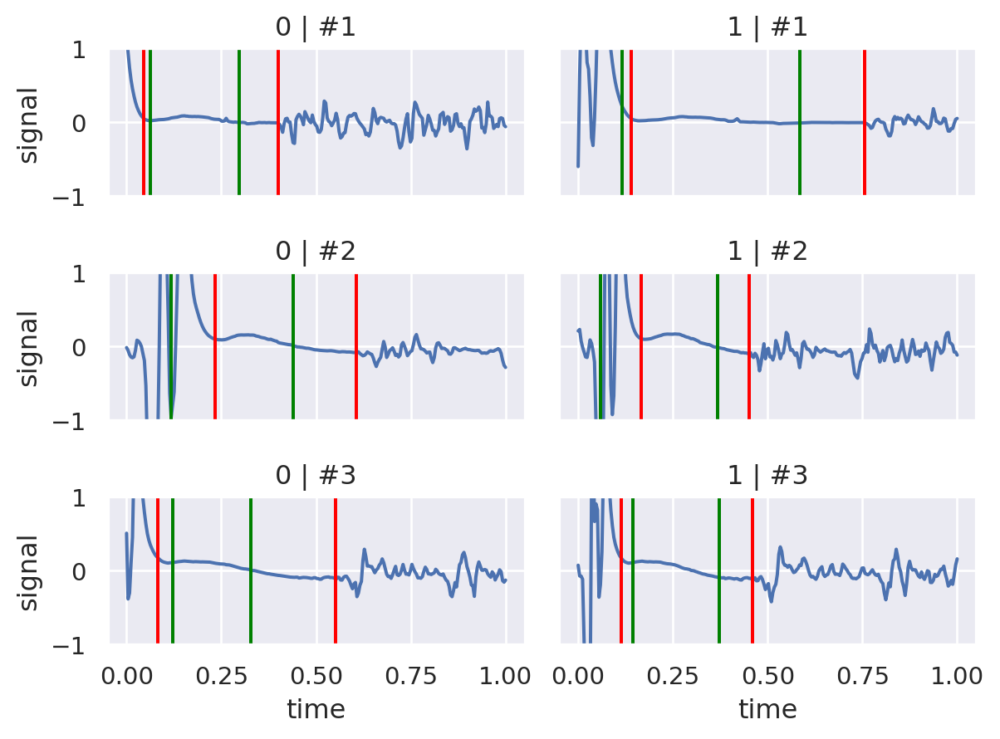

In [ ]:
plot(EvalModel(model, eval_loader).loc[[0,1,2,200,201,202],:],{"csp":"red","csp_pred":"green"})

In [ ]:
arch = "XResNet1d"
model = load_model(arch,256)
csp_dataset_train_warp = CSPDataSet("/content/drive/MyDrive/CSP/data.json",indices=tr,
                                    transform=Compose([AsTensor()]))
csp_dataset_test_warp = CSPDataSet("/content/drive/MyDrive/CSP/data.json",indices=te,
                                    transform=Compose([AsTensor()]))
csp_dataset_eval = CSPDataSet("/content/drive/MyDrive/CSP/data.json",
                                    transform=Compose([WarpTransform(mag=0,downsample_to=256,random_crop_probab=0),AsTensor()]))
train_loader = DataLoader(csp_dataset_train_warp, batch_size=32,
                        shuffle=True, num_workers=2,collate_fn=collate_fn)
eval_loader = DataLoader(csp_dataset_eval, batch_size=32,
                        shuffle=False, num_workers=0, collate_fn=collate_fn)

n_epochs = 4000
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())
model.train()
i=0
for epoch in range(n_epochs):
    for batch in train_loader:
        y_pred = model(batch["signal"][:,None,:].to("cuda"))
        loss = loss_fn(y_pred, batch["csp"].to("cuda"))
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    if epoch%100==0:
        df = df_pred(model,eval_loader,csp_dataset_eval)
        for (_,stat),dic in df.groupby("training").agg({"csp_diff":["min","max","mean",rms]}).to_dict().items():
            if stat=="rms":
                print("epoch",epoch,stat+"/train",dic[True],stat+"/test",dic[False])
            writer.add_scalar(arch+"/"+stat+"/train",dic[True],i)
            writer.add_scalar(arch+"/"+stat+"/test",dic[False],i)
        fig, ax1 = plt.subplots(figsize=(6,6))
        sns.scatterplot(data=df,x="csp",y="csp_pred",hue="training",ax=ax1)
        writer.add_figure(arch+"/scatter",fig,i)
        i+=1

epoch 0 rms/train 0.11593567382405852 rms/test 0.10832480364323276
epoch 100 rms/train 0.09780513616866701 rms/test 0.08443530783677672
epoch 200 rms/train 0.08550226238047222 rms/test 0.07810384850729152
epoch 300 rms/train 0.08046948659430671 rms/test 0.07438929925377066
epoch 400 rms/train 0.07262571677302462 rms/test 0.06738596483721189
epoch 500 rms/train 0.07448778284001284 rms/test 0.06812278371320606
epoch 600 rms/train 0.07157549739707723 rms/test 0.0671181321764661
epoch 700 rms/train 0.07283499782993318 rms/test 0.07118760103099113
epoch 800 rms/train 0.07351967031788606 rms/test 0.07369234928778835
epoch 900 rms/train 0.0741765916896227 rms/test 0.07089714946091272
epoch 1000 rms/train 0.08505221592112118 rms/test 0.07839055291188013


KeyboardInterrupt: ignored

In [ ]:
# Super Resolution model definition in PyTorch
import torch.nn as nn
import torch.nn.init as init


class SuperResolutionNet(nn.Module):
    def __init__(self, upscale_factor, inplace=False):
        super(SuperResolutionNet, self).__init__()

        self.relu = nn.ReLU(inplace=inplace)
        self.conv1 = nn.Conv2d(1, 64, (5, 5), (1, 1), (2, 2))
        self.conv2 = nn.Conv2d(64, 64, (3, 3), (1, 1), (1, 1))
        self.conv3 = nn.Conv2d(64, 32, (3, 3), (1, 1), (1, 1))
        self.conv4 = nn.Conv2d(32, upscale_factor ** 2, (3, 3), (1, 1), (1, 1))
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)

        self._initialize_weights()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = self.pixel_shuffle(self.conv4(x))
        return x

    def _initialize_weights(self):
        init.orthogonal_(self.conv1.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv3.weight, init.calculate_gain('relu'))
        init.orthogonal_(self.conv4.weight)

# Create the super-resolution model by using the above model definition.
torch_model = SuperResolutionNet(upscale_factor=3)

In [ ]:
# Load pretrained model weights
model_url = 'https://s3.amazonaws.com/pytorch/test_data/export/superres_epoch100-44c6958e.pth'
batch_size = 1    # just a random number

# Initialize model with the pretrained weights
map_location = lambda storage, loc: storage
if torch.cuda.is_available():
    map_location = None
torch_model.load_state_dict(model_zoo.load_url(model_url, map_location=map_location))

# set the model to inference mode
torch_model.eval()

In [ ]:
model.eval()

InceptionTimePlus(
  (backbone): Sequential(
    (0): InceptionBlockPlus(
      (inception): ModuleList(
        (0): InceptionModulePlus(
          (bottleneck): ConvBlock(
            (0): Conv1d(1, 32, kernel_size=(1,), stride=(1,), bias=False)
          )
          (convs): ModuleList(
            (0): ConvBlock(
              (0): Conv1d(32, 32, kernel_size=(39,), stride=(1,), padding=(19,), bias=False)
            )
            (1): ConvBlock(
              (0): Conv1d(32, 32, kernel_size=(19,), stride=(1,), padding=(9,), bias=False)
            )
            (2): ConvBlock(
              (0): Conv1d(32, 32, kernel_size=(9,), stride=(1,), padding=(4,), bias=False)
            )
          )
          (mp_conv): Sequential(
            (0): MaxPool1d(kernel_size=3, stride=1, padding=1, dilation=1, ceil_mode=False)
            (1): ConvBlock(
              (0): Conv1d(1, 32, kernel_size=(1,), stride=(1,), bias=False)
            )
          )
          (concat): Concat(dim=1)
      

In [ ]:
# Input to the model
x = torch.randn(64, 1, 512, requires_grad=True)
torch_out = model.cpu()(x)

# Export the model
torch.onnx.export(model,               # model being run
                  x,                         # model input (or a tuple for multiple inputs)
                  "ception.onnx",   # where to save the model (can be a file or file-like object)
                  export_params=True,        # store the trained parameter weights inside the model file
                  opset_version=10,          # the ONNX version to export the model to
                  do_constant_folding=True,  # whether to execute constant folding for optimization
                  input_names = ['input'],   # the model's input names
                  output_names = ['output'], # the model's output names
                  dynamic_axes={'input' : {0 : 'batch_size'},    # variable length axes
                                'output' : {0 : 'batch_size'}})

============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



In [ ]:
import onnx

onnx_model = onnx.load("inception.onnx")
onnx.checker.check_model(onnx_model)

In [ ]:
import onnxruntime

ort_session = onnxruntime.InferenceSession("super_resolution.onnx",providers=["CPUExecutionProvider"])

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(x)}
ort_outs = ort_session.run(None, ort_inputs)

# compare ONNX Runtime and PyTorch results
np.testing.assert_allclose(to_numpy(torch_out), ort_outs[0], rtol=1e-03, atol=1e-05)

print("Exported model has been tested with ONNXRuntime, and the result looks good!")

In [ ]:
# License: BSD-3
import numpy as np
import pandas as pd
import torch
from skorch.callbacks import LRScheduler
from skorch.helper import predefined_split

from braindecode import EEGRegressor
from braindecode.preprocessing import create_fixed_length_windows
from braindecode.datasets import BaseDataset, BaseConcatDataset
from braindecode.training.losses import CroppedLoss
from braindecode.models import Deep4Net
from braindecode.models import ShallowFBCSPNet
from braindecode.models.util import to_dense_prediction_model, get_output_shape
from braindecode.util import set_random_seeds, create_mne_dummy_raw
